In [ ]:
! pip install datasets

In [2]:
from datasets import load_dataset
ds = load_dataset("naver-clova-ix/cord-v2")

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
print(ds)

DatasetDict({
    train: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 800
    })
    validation: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
    test: Dataset({
        features: ['image', 'ground_truth'],
        num_rows: 100
    })
})


<PIL.PngImagePlugin.PngImageFile image mode=RGB size=864x1296 at 0x7F9E896B5E40>
<class 'list'>
<class 'PIL.PngImagePlugin.PngImageFile'>


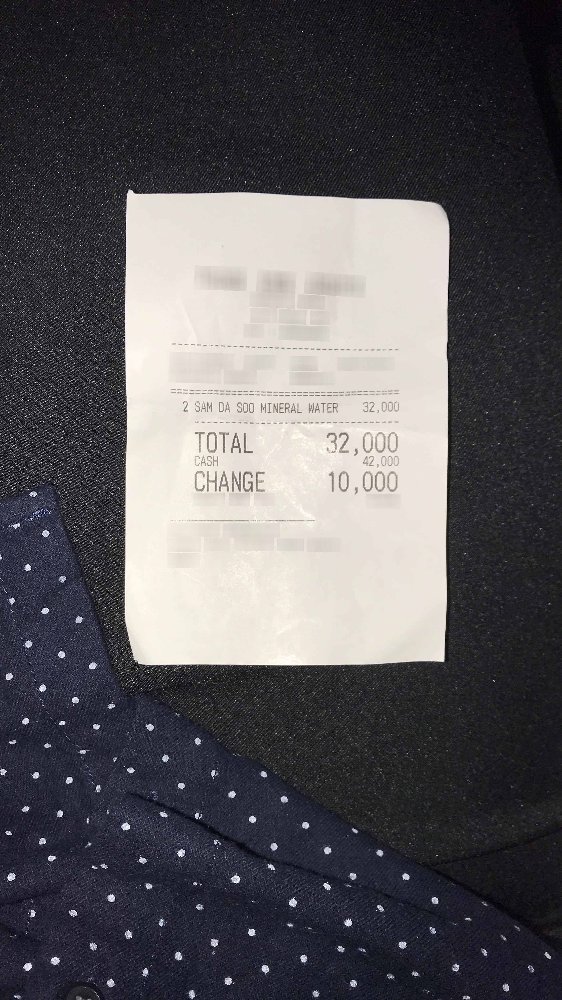

In [24]:
train_img_data = ds['train']['image']
print(train_img_data[0])
print(type(train_img_data)) # <class 'list'>
print(type(train_img_data[0])) # PIL.JpegImagePlugin.JpegImageFile
train_img_data[100].show()

In [4]:
import json 
train_img_gt = ds['train']['ground_truth']
with open('train_img_gt.json', 'w', encoding='utf-8') as f:
    json.dump(train_img_gt, f, indent=4)


In [7]:
import json

train_img_data = ds['train']['image']
train_img_gt = ds['train']['ground_truth']
cord_train = {}
cord_train['images'] = {}

images = cord_train['images']

# convert to UFO format

for i in range(len(train_img_data)):
    ground_truth = json.loads(ground_truth[i])
    images[f"cord_train_{i+1}.jpg"] = {}
    
    curr_image = images[f"cord_train_{i+1}.jpg"]
    curr_image["paragraphs"] = {}
    curr_image["words"] = {}
    
    valid_line = ground_truth['valid_line']
    image_count = 0
    
    for j in range(len(valid_line)):
      for k in range(len(valid_line[j]["words"])):
        image_count += 1
        curr_word = valid_line[j]['words'][k]
        curr_quad = curr_word['quad']
        curr_image["words"][image_count] = {
            "transcription": curr_word['text'],
            "points":[ [curr_quad['x1'], curr_quad['y1']], 
                      [curr_quad['x2'], curr_quad['y2']], 
                      [curr_quad['x3'], curr_quad['y3']], 
                      [curr_quad['x4'], curr_quad['y4']] ]
        }
    curr_image["chars"] = {}
    curr_image["img_w"] = ground_truth['meta']['image_size']['width']
    curr_image["img_h"] = ground_truth['meta']['image_size']['height']
    curr_image["num_patches"] = None
    curr_image["tags"] = []
    curr_image["relations"] = {}
    curr_image["annotation_log"] = {
          "worker": "worker",
          "timestamp": "2022-07-20",
          "tool_version": "",
          "source": None
      }
    curr_image["license_tag"] = {
      "usability": True,
      "public": True,
      "commercial": True,
      "type": None,
      "holder": "Naver Clova"
    }
    
with open('cord_train.json', 'w', encoding='utf-8') as f:
    json.dump(cord_train, f, indent=4)
